# Uber Pickups  Project

In [202]:
import pandas as pd 
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.kaleido.scope.plotlyjs = r'C:\Users\Public\plotly\package_data\plotly.min.js'
pio.renderers.default = "png" # Comment / delete this line for interactive graphs

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings("ignore")

## Part 1: Exploratory data analysis and preprocessings

### 1.1 Import data and explore ###

In [40]:
dataset = pd.read_csv("./data/uber-raw-data-sep14.csv")

In [41]:
dataset.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [42]:
dataset.shape

(1028136, 4)

In [43]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1028136 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   Date/Time  1028136 non-null  object 
 1   Lat        1028136 non-null  float64
 2   Lon        1028136 non-null  float64
 3   Base       1028136 non-null  object 
dtypes: float64(2), object(2)
memory usage: 31.4+ MB


In [44]:
dataset.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [45]:
# As the dataset is quite big, we will work on a sample of 10 000 entries
data = dataset.sample(100000, random_state = 0)

# # Base column is unusefull so we drop it
data = data.drop("Base", axis = 1)

In [46]:
data["Date/Time"] = pd.to_datetime(data["Date/Time"], format='%m/%d/%Y %H:%M:%S')
data.head()

,Date/Time,Lat,Lon
310176,2014-09-04 08:39:00,40.6165,-73.9510
243214,2014-09-26 18:16:00,40.7303,-73.9895
486503,2014-09-17 10:11:00,40.8194,-73.9445
695475,2014-09-07 13:16:00,40.7131,-73.9595
885696,2014-09-09 15:15:00,40.7623,-73.9785


In [47]:
data["Day"] = data["Date/Time"].dt.day
data["Hour"] = data["Date/Time"].dt.hour
data["DayOfWeek"] = data["Date/Time"].dt.day_name()


In [48]:
data.head()

,Date/Time,Lat,Lon,Day,Hour,DayOfWeek
310176,2014-09-04 08:39:00,40.6165,-73.9510,4,8,Thursday
243214,2014-09-26 18:16:00,40.7303,-73.9895,26,18,Friday
486503,2014-09-17 10:11:00,40.8194,-73.9445,17,10,Wednesday
695475,2014-09-07 13:16:00,40.7131,-73.9595,7,13,Sunday
885696,2014-09-09 15:15:00,40.7623,-73.9785,9,15,Tuesday


### 1.2 Make some graphs ###

#### Number of trips over the month ####

In [26]:
month_trips = pd.DataFrame(data['Day'].value_counts().reset_index())
month_trips.columns = ['Day', 'Count']

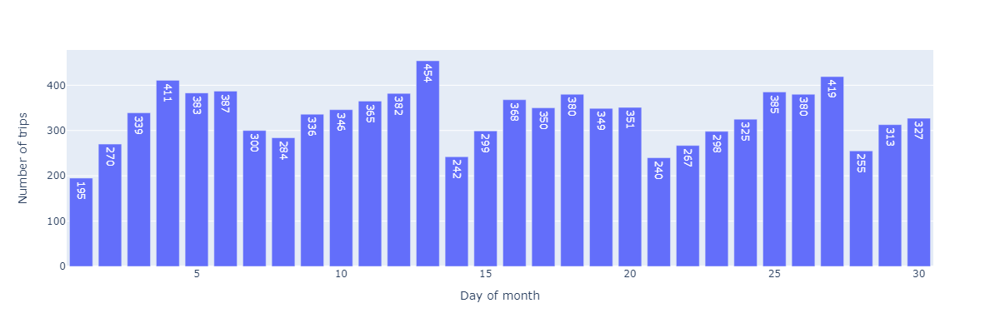

In [29]:
px.bar(month_trips, x = "Day", 
       y = "Count", 
       labels = {'Day': 'Day of month', 'Count': 'Number of trips'}, 
       text = 'Count',
       width = 1200, height = 400)

September 1, 2014 was a Monday. According to this graph, it is therefore possible to observe a certain periodicity in the requests, the more the week progresses, the more the number of races seems to increase.

#### Number of trips by day of week ####

In [28]:
days_trips = pd.DataFrame(data["DayOfWeek"].value_counts()).reset_index()
days_trips.columns = ['DayOfWeek', 'Count']

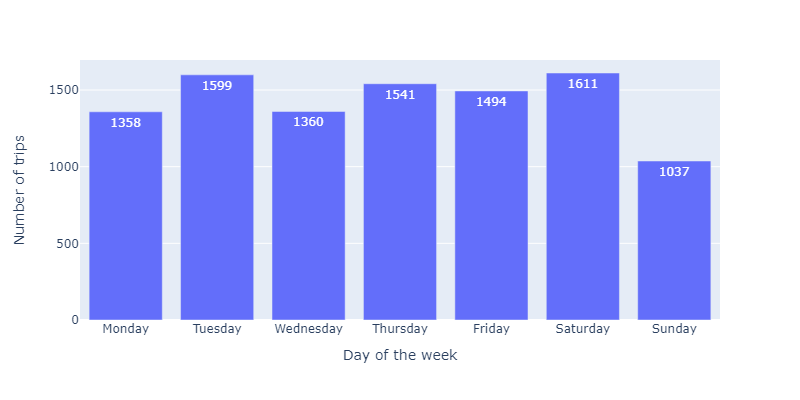

In [22]:
fig = px.bar(days_trips, x = "DayOfWeek", 
       y = "Count", 
       labels = {'DayOfWeek': 'Day of the week', 'Count': 'Number of trips'}, 
       text = 'Count',
       height = 400, width = 800)
fig.update_xaxes(categoryorder = "array", categoryarray = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"])
fig.show()

There are more requests on Tuesday and Saturday than on other days of the week.

#### Number of trips by hour ####

In [30]:
hours_trips = pd.DataFrame(data.groupby(["DayOfWeek", "Hour"].value_counts()).reset_index()
hours_trips.columns = ['Hour', 'Count']
hours_trips

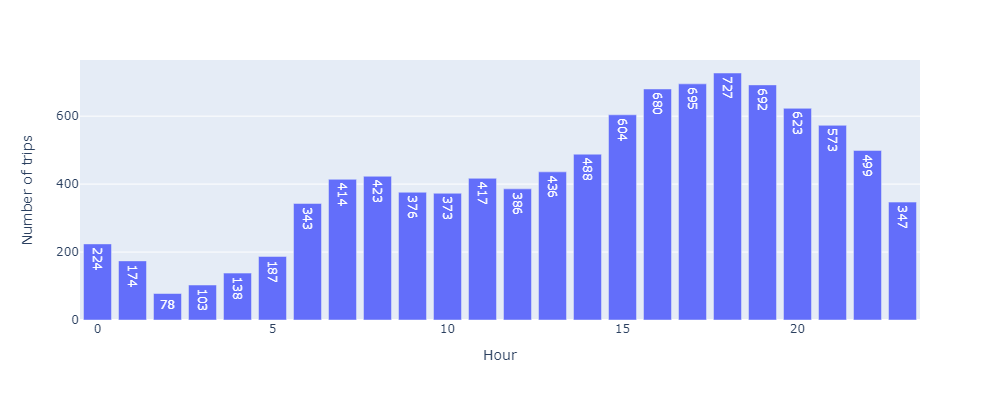

In [25]:
px.bar(hours_trips, x = "Hour", 
       y = "Count", 
       labels = {'Hour': 'Hour', 'Count': 'Number of trips'}, 
       text = 'Count',
       height = 400, width = 1000)

Certain times of the day have a greater number of races than other times of the day. These periods of high demand can be called rush hours.

In summary:
- Tuesday and Saturday are the days with the most trips,
- certain hours, which could be described as rush hours, also have more requests than others.
  
Based on the results obtained so far, it would not be relevant to provide Uber with the hotspots day by day, these would probably not be reproducible from month to month. On the other hand, defining them according to the day of the week (average of Mondays, average of Tuesdays, etc.) would allow a good representativeness of the requests. Similarly, adding the timeframe corresponding to the hour would allow greater precision, a certain periodicity having been observed according to this criterion.
  
For the rest of the analyses, we are therefore going to create a new variable combining the day of the week and the time. This, in combination with the geolocation of users (latitude and longitude), will be used in the next preprocessing steps.

In [49]:
data["Date/Hour"] = data["Date/Time"].dt.floor("H")
data["DayOfWeek/Hour"] = data["Date/Hour"].dt.strftime("%A-%H:%M:00") 
data = data.sort_values(["Hour","DayOfWeek"], ascending = [True,True]) 

to_keep = ["Lat", "Lon", "DayOfWeek/Hour"]
data = data[to_keep]
data.head()

,Lat,Lon,DayOfWeek/Hour
322795,40.7185,-74.0012,Friday-00:00:00
594392,40.7606,-73.9759,Friday-00:00:00
594406,40.7298,-74.0043,Friday-00:00:00
819704,40.8082,-73.9410,Friday-00:00:00
511136,40.7252,-73.9815,Friday-00:00:00


A choice has been made concerning the position data: these are not normalized, in order not to cause a "compression" effect in one direction more than another, a displacement of 1° in the latitude and in the longitude not having the same values in kilometers.

Finally, in order to achieve clustering by timeframe, ie the combination of the day of the week and the time, it is important to separate them.

In [51]:
timeframes = data["DayOfWeek/Hour"].unique()
data_by_timeframe = []
for timeframe in timeframes:
    data_by_timeframe.append(data[data["DayOfWeek/Hour"] == timeframe])
print("Number of timeframes: ", len(data_by_timeframe))

Number of timeframes:  168


## Part 2 : KMeans clustering algorithm

During a KMeans analysis, the only variable to be defined is the number of optimal clusters for a specific dataset. Moreover, for our particular problem, the number of clusters could also vary between the different dataframes. A search for the optimal parameter (k) for each dataframe is therefore to be carried out.  
  
We have therefore chosen here, for each dataframe, to run the algorithm 9 times by varying the hyperparameter k from 2 to 10, and to calculate for each the silhouette score and the WCSS inertia.  
- The lower the WCSS inertia is, the closer the points of one given cluster are close from each other, we want to find an optimal 'k' with a low inertia (to allow drivers not to have to drive too far away to find clients)
- Also, the higher the silhouette score is, the better the partition between clusters is, we would also want to keep this score as high as possible.
  
**=> To get the better compromise between the 2, we will scale these 2 characteristics and take for each timeframe the 'k' that maximizes the score = scaled silhouette score - scaled WCSS inertia, and keep the corresponding k hyperparameter.**

In [61]:
# Define for each timeframe the best number of clusters to use

print(f"Finding the optinum k hyperparameter for each of the {len(data_by_timeframe)} timeframes...")

optimum_k_list = []
scaler = StandardScaler()

for i in range(len(data_by_timeframe)):

    wcss_list = []
    sil_list = []
    k_list = []
        
    for k in range(2, 11):
            
        X = data_by_timeframe[i][["Lat", "Lon"]]
        kmeans = KMeans(n_clusters = k, random_state = 0)
        kmeans.fit(X)
        wcss_list.append(kmeans.inertia_)
        sil_list.append(silhouette_score(X, kmeans.predict(X)))
        k_list.append(k)
        
    k_choice = pd.DataFrame({'k':k_list, 'WCSS':wcss_list, 'Silhouette Score':sil_list}).set_index('k')
    k_choice_scaled = scaler.fit_transform(k_choice)
    k_choice['score'] = k_choice_scaled[:,1] - k_choice_scaled[:,0]
    optimum_k = k_choice.index[k_choice['score'].argmax()]
    optimum_k_list.append(optimum_k)

    if i%5 == 0:
        print(f"{i} / {len(data_by_timeframe)}")

print("Done!")

Finding the optinum k hyperparameter for each of the 168 timeframes...
0 / 168
5 / 168
10 / 168
15 / 168
20 / 168
25 / 168
30 / 168
35 / 168
40 / 168
45 / 168
50 / 168
55 / 168
60 / 168
65 / 168
70 / 168
75 / 168
80 / 168
85 / 168
90 / 168
95 / 168
100 / 168
105 / 168
110 / 168
115 / 168
120 / 168
125 / 168
130 / 168
135 / 168
140 / 168
145 / 168
150 / 168
155 / 168
160 / 168
165 / 168
Done!


In [64]:
# Run optimized KMeans on each timeframe

print(f"Fitting optimized KMeans on the {len(data_by_timeframe)} timeframes...")

for i in range(len(data_by_timeframe)): 
    
    kmeans = KMeans(n_clusters = optimum_k_list[i], random_state = 0)
    kmeans.fit(data_by_timeframe[i][["Lat", "Lon"]])
    data_by_timeframe[i]["cluster"] = kmeans.labels_
    data_by_timeframe[i] = data_by_timeframe[i].sort_values('cluster')
    
    if i%5 == 0:
        print(f"{i} / {len(data_by_timeframe)}")

print("Done!")

Fitting optimized KMeans on the 168 timeframes...
0 / 168
5 / 168
10 / 168
15 / 168
20 / 168
25 / 168
30 / 168
35 / 168
40 / 168
45 / 168
50 / 168
55 / 168
60 / 168
65 / 168
70 / 168
75 / 168
80 / 168
85 / 168
90 / 168
95 / 168
100 / 168
105 / 168
110 / 168
115 / 168
120 / 168
125 / 168
130 / 168
135 / 168
140 / 168
145 / 168
150 / 168
155 / 168
160 / 168
165 / 168
Done!


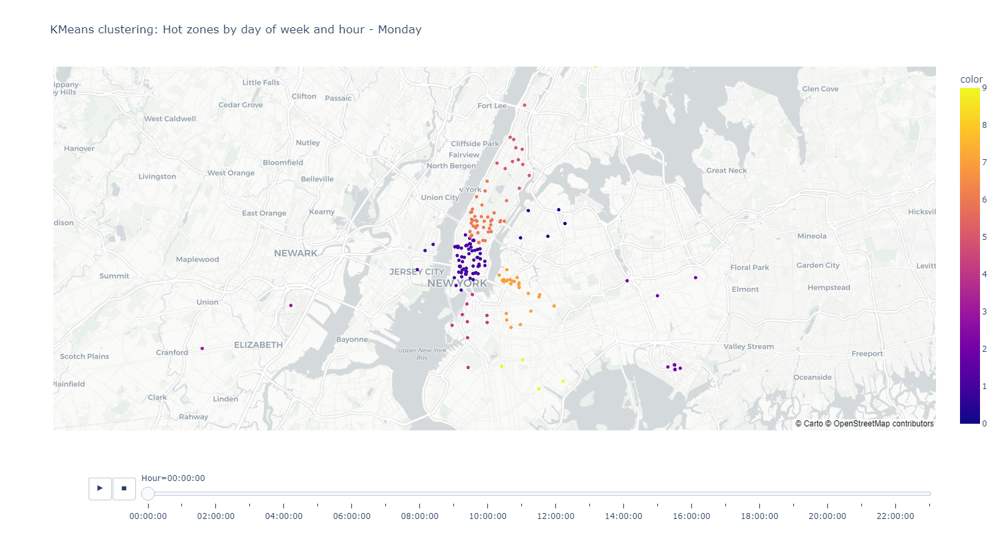

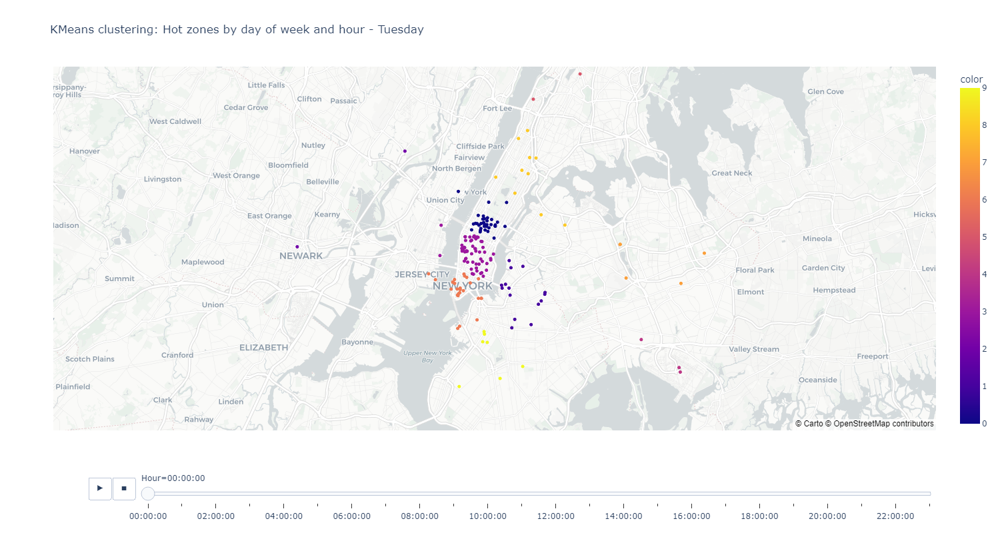

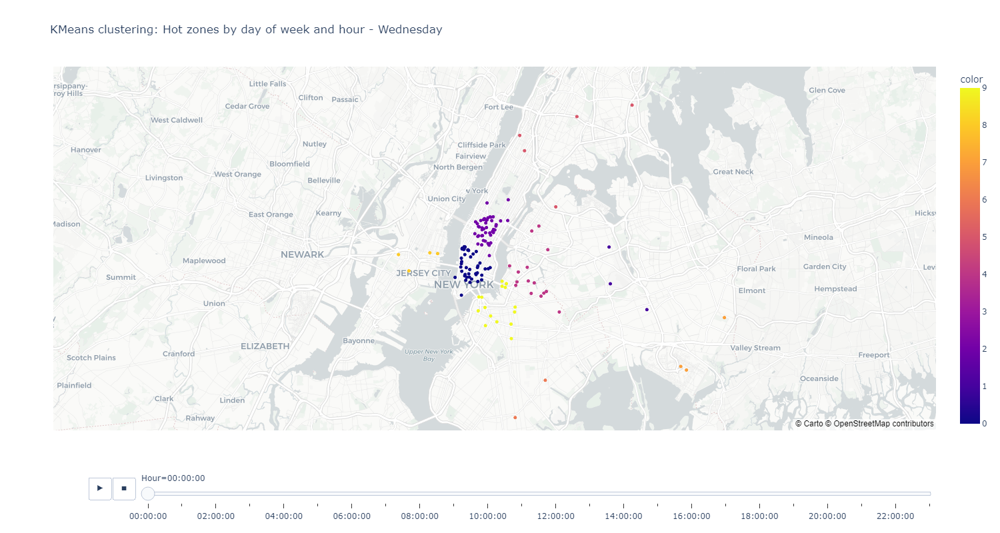

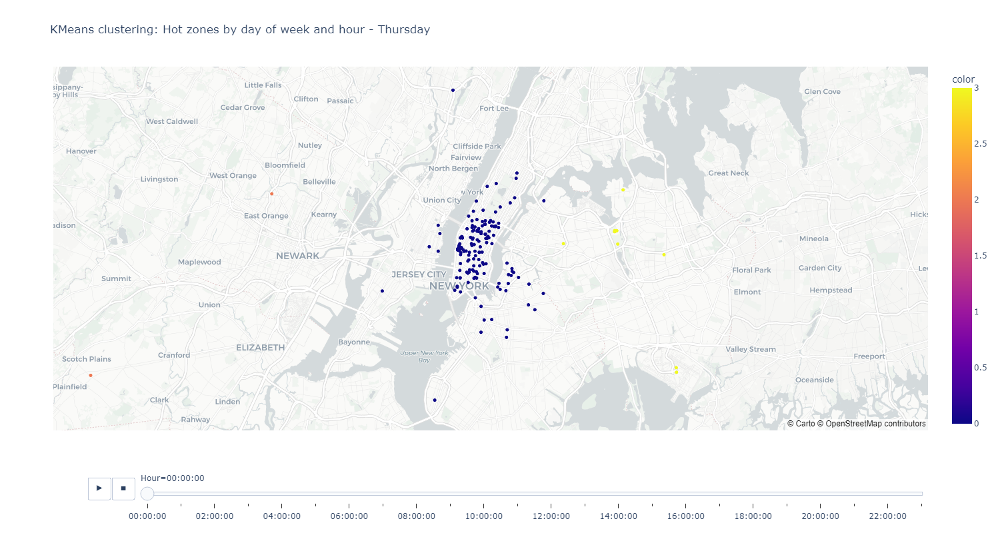

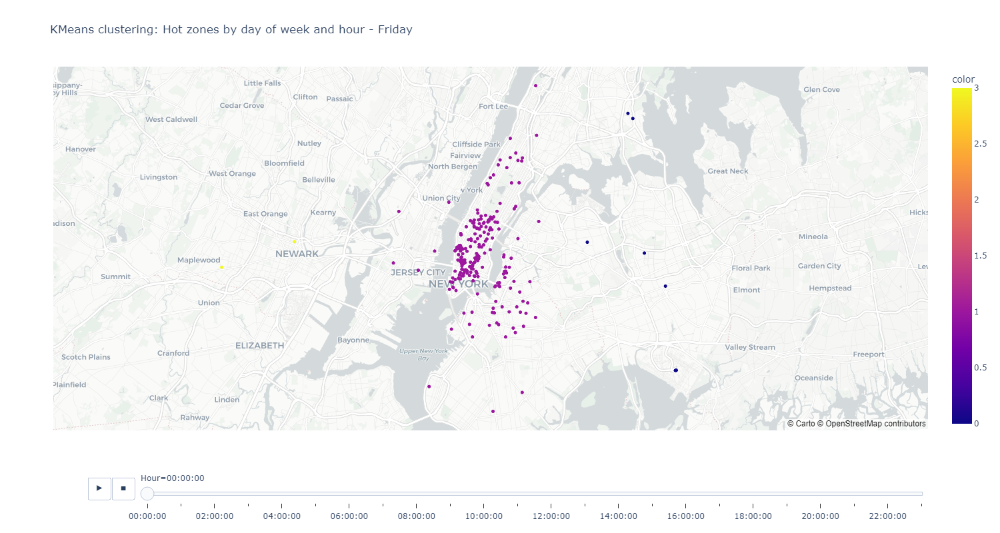

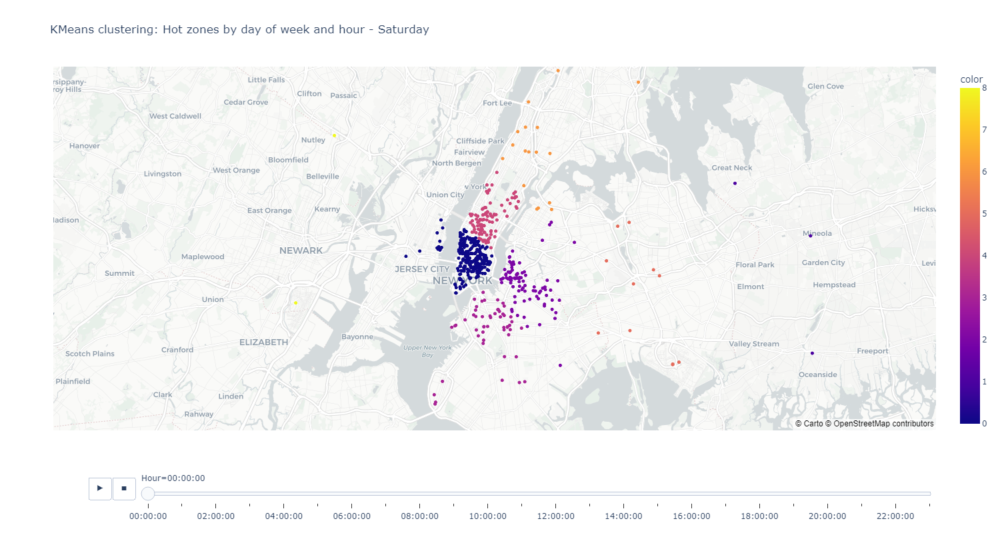

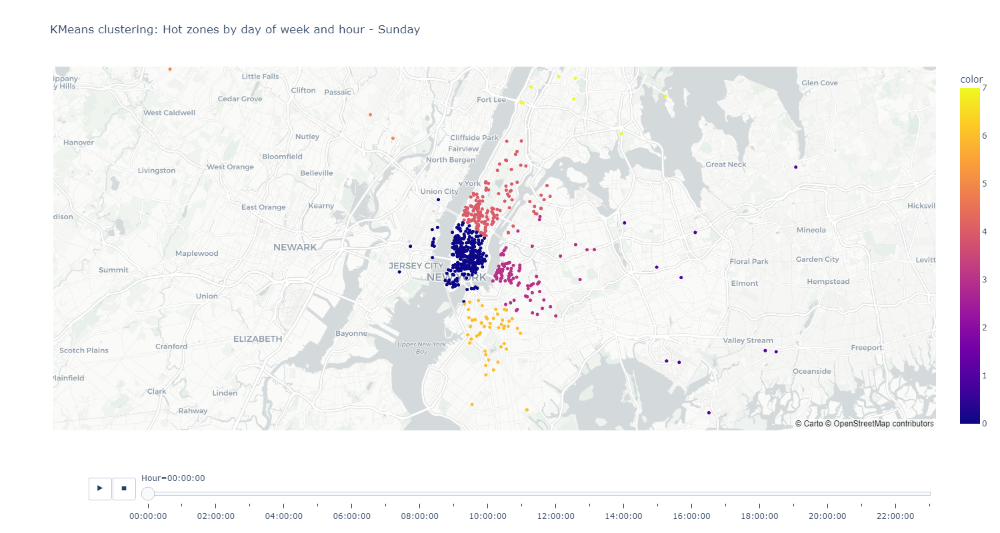

In [196]:
df_kmeans = pd.concat(data_by_timeframe)
df_kmeans["DayOfWeek"] = df_kmeans["DayOfWeek/Hour"].str.partition('-')[0]
df_kmeans["Hour"] = df_kmeans["DayOfWeek/Hour"].str.partition('-')[2]

# Generate visualizations of the results

for day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'] :

    fig = px.scatter_mapbox(df_kmeans[df_kmeans['DayOfWeek'] == day], 
                            lat = "Lat", lon = "Lon", 
                            color = df_kmeans[df_kmeans['DayOfWeek'] == day]['cluster'], 
                            title = f"KMeans clustering: Hot zones by day of week and hour - {day}", 
                            animation_frame = "Hour", animation_group = "Hour", 
                            zoom = 10, mapbox_style = "carto-positron", height = 800, width = 1500)
    
    fig.show() # Show a non interactive image for Git
    
    with open('./figures/KMeans_hot_spots_graph.html', 'a') as f:
        f.write(fig.to_html(full_html = False, include_plotlyjs = 'cdn'))

The generated figures make it easy to follow the evolution of the clusters over time, but also to compare the location of these clusters between the different days of the week.
  
However, the clusters detected here only take into account the "distance" between the points, which is not the aim here. We seek more to define areas according to their density of demand, which is the role of the DBSCAN algorithm.

## Part 3 : DBSCAN clustering algorithm

Uber's research shows that users accept to wait 5-7 minutes, otherwise they would cancel their ride.  
Thus, the driver should be at a distance that allow him to pick the user in less than this time.  
Based on the fact that in 2013, the average taxi speed in NYC is around 13km/h, the driver must be not much further than 1km (v = d/t => t = v*d = 13/60 * 5).

In [204]:
# Set the DBSCAN constant hyperparameters

eps = 0.5 / 100 # corresponds to 0.5km radius
min_samples = int(0.01 * np.mean([len(tf) for tf in data_by_timeframe])) # defining min_samples as a 1% of the overall average demand by timeframe

# Run distinct DBSCAN for each timeframe

print(f"Fitting one DBSCAN on each of the {len(timeframe_data_list)} timeframes with a minimum sample size of {min_samples}:") 

for i in range(len(data_by_timeframe)):
    
    X = data_by_timeframe[i][["Lat", "Lon"]]
    dbscan = DBSCAN(eps = eps, min_samples = min_samples, metric = "euclidean")
    dbscan.fit(X)
    
    data_by_timeframe[i]["cluster"] = dbscan.labels_
    data_by_timeframe[i] = data_by_timeframe[i].sort_values('cluster')
    
    if i%5 == 0:
        print(f"{i} / {len(data_by_timeframe)}")

print("Done!")

Fitting one DBSCAN on each of the 168 timeframes with a minimum sample size of 5:
0 / 168
5 / 168
10 / 168
15 / 168
20 / 168
25 / 168
30 / 168
35 / 168
40 / 168
45 / 168
50 / 168
55 / 168
60 / 168
65 / 168
70 / 168
75 / 168
80 / 168
85 / 168
90 / 168
95 / 168
100 / 168
105 / 168
110 / 168
115 / 168
120 / 168
125 / 168
130 / 168
135 / 168
140 / 168
145 / 168
150 / 168
155 / 168
160 / 168
165 / 168
Done!


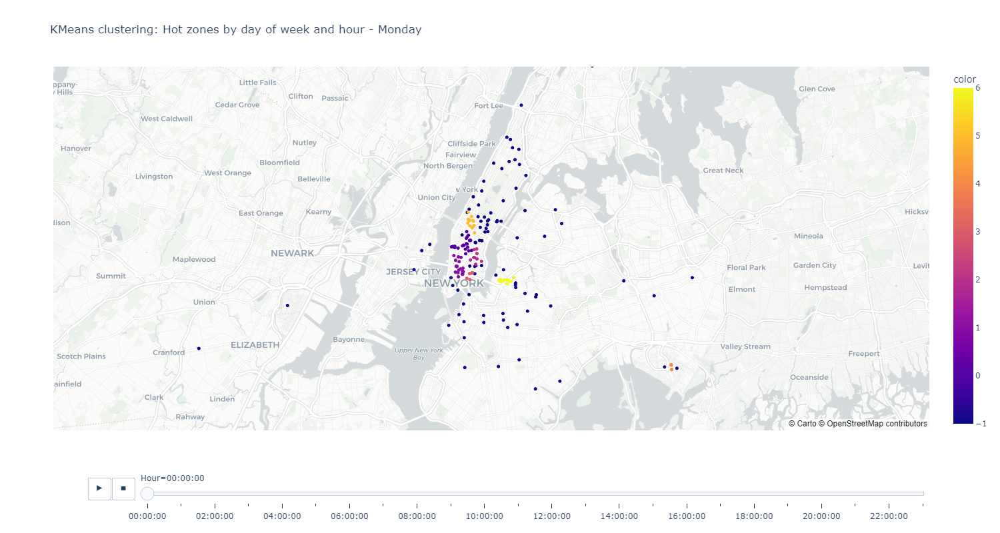

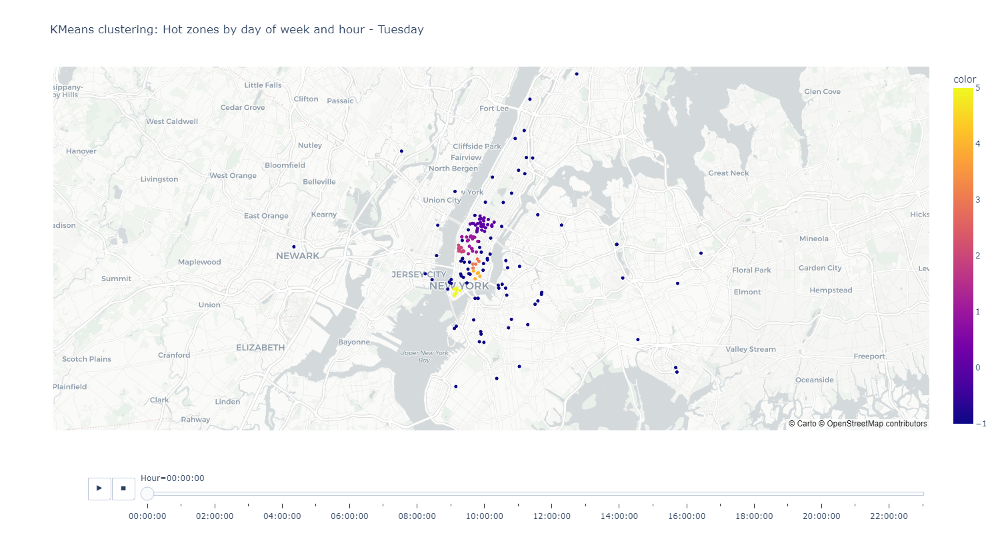

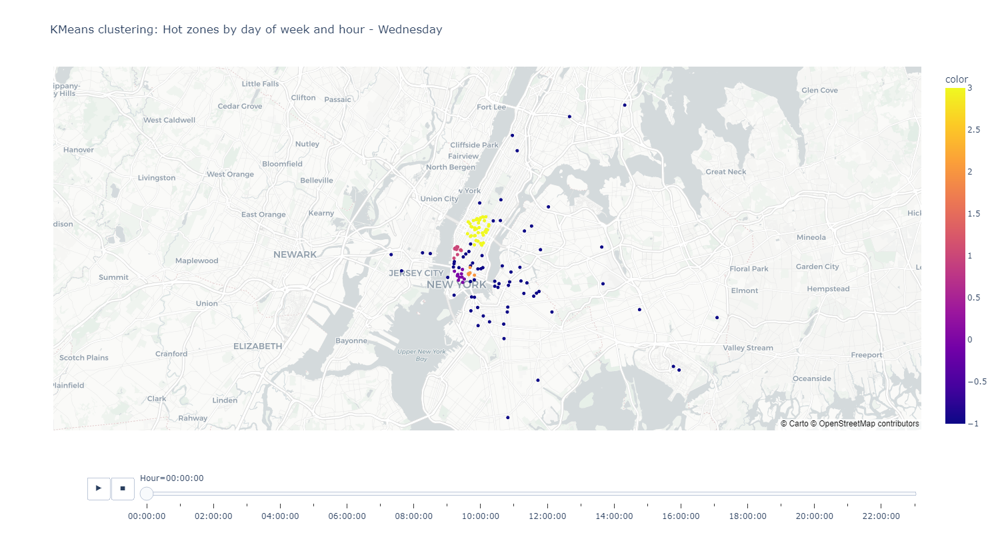

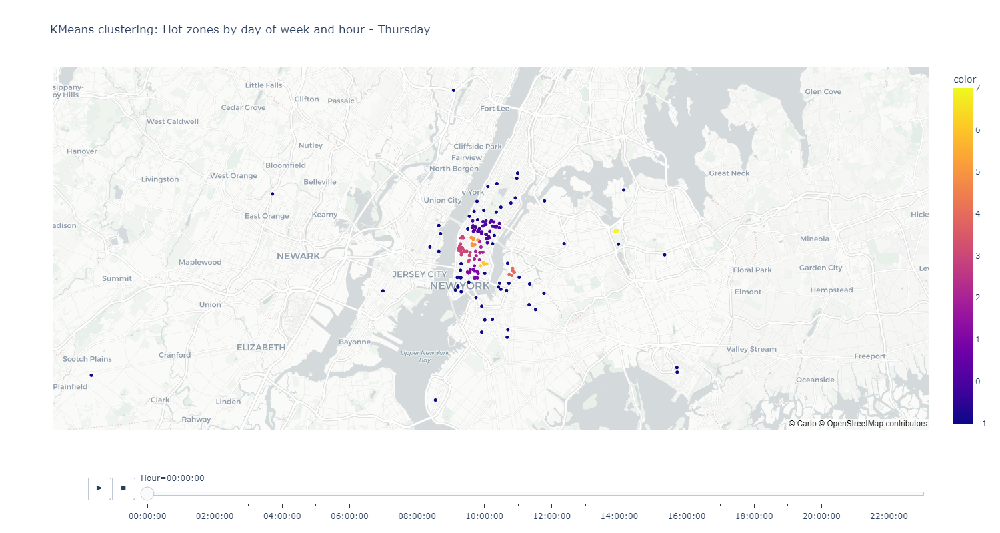

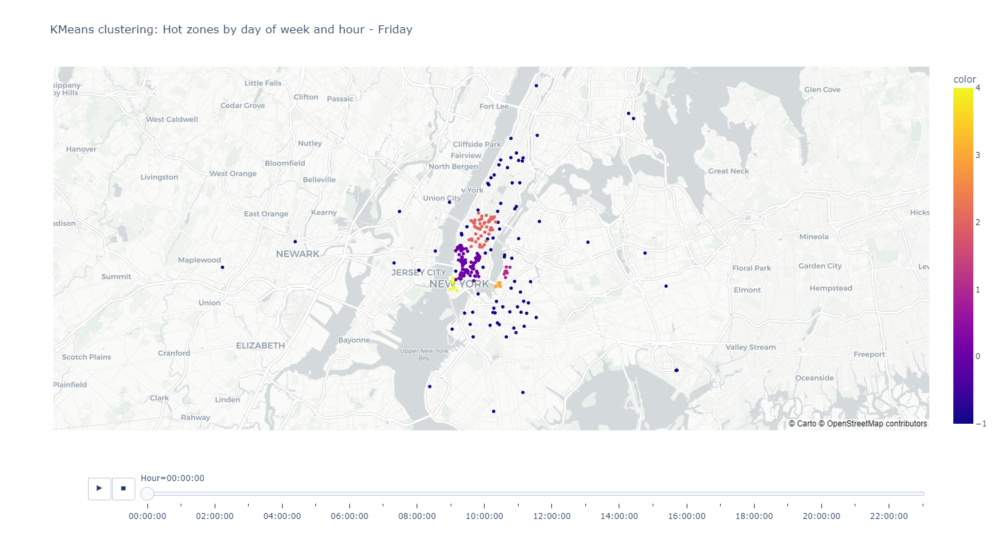

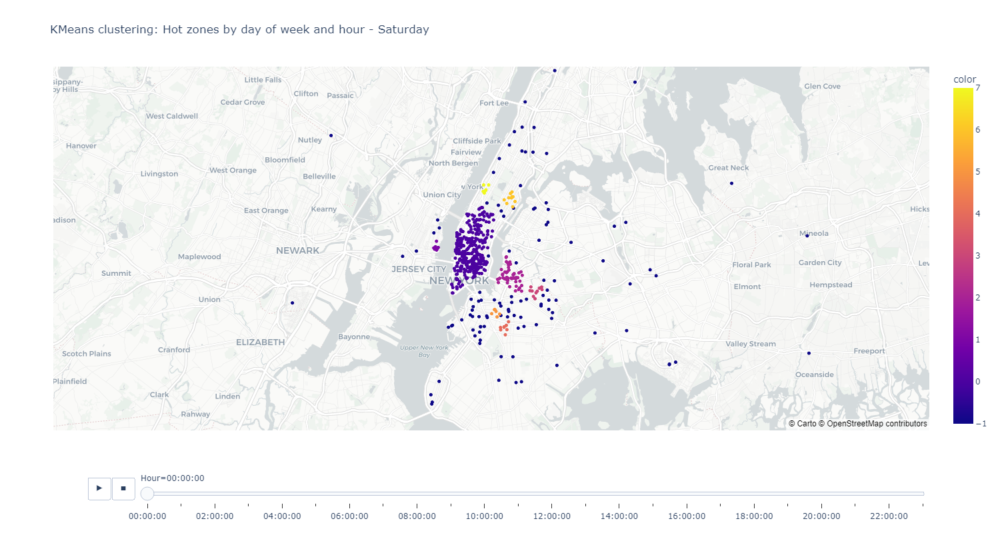

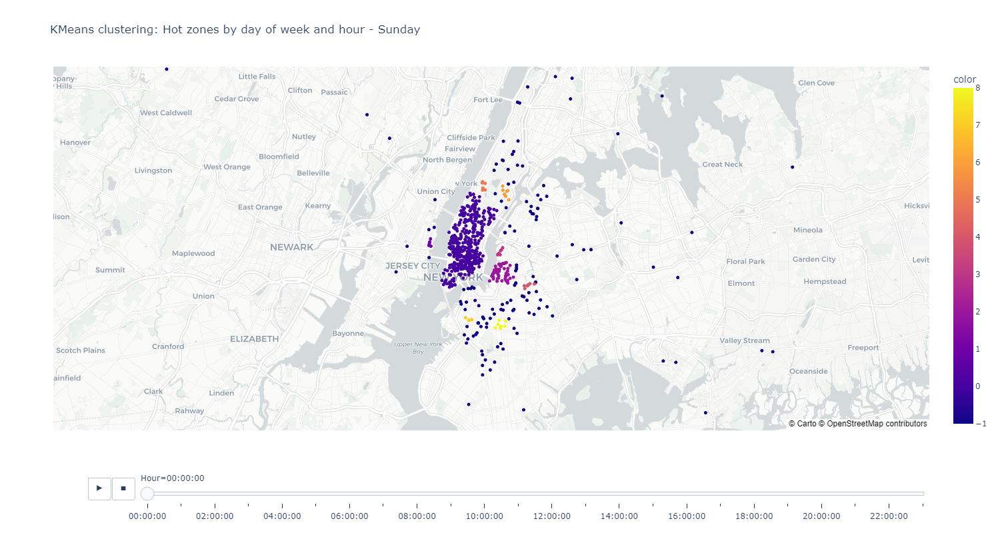

In [205]:
df_dbscan = pd.concat(data_by_timeframe)
df_dbscan["DayOfWeek"] = df_dbscan["DayOfWeek/Hour"].str.partition('-')[0]
df_dbscan["Hour"] = df_dbscan["DayOfWeek/Hour"].str.partition('-')[2]

# Generate visualizations of the results

for day in ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'] :

    fig = px.scatter_mapbox(df_dbscan[df_dbscan['DayOfWeek'] == day], 
                            lat = "Lat", lon = "Lon", 
                            color = df_dbscan[df_dbscan['DayOfWeek'] == day]['cluster'], 
                            title = f"KMeans clustering: Hot zones by day of week and hour - {day}", 
                            animation_frame = "Hour", animation_group = "Hour", 
                            zoom = 10, mapbox_style = "carto-positron", height = 800, width = 1500)
    
    fig.show() # Show a non interactive image for Git
    
    with open('./figures/DBSCAN_hot_spots_graph.html', 'a') as f:
        f.write(fig.to_html(full_html = False, include_plotlyjs = 'cdn'))

Again, these graphs allow us to track the evolution of Uber request hot spots by day, over time, but this time, based on request density. The results obtained here are therefore more relevant than those obtained using the KMeans algorithm.
  
If we look at the results obtained, we can see two main things:
- the midtown / downtown area of Manhattan is always an area with high demand, although there is a slight decrease in demand late at night (between 11 p.m. and 4 a.m. the next day), with the exception of Friday and Saturday . This observation is consistent with the fact that Manhattan is a neighborhood known for having many offices, but also many tourist sites and nightlife spots.
- JFK and La Guardia airports are also areas where travel demand can be high, especially in the afternoon and evening.
  
Based on this analysis, Uber should therefore be able to best distribute its drivers according to demand, and therefore limit the wait and the risk of cancellation for its users.